
# Text Analysis of Amazon Grocery_and_Gourmet_Food Product Reviews.

###### Name : Manimadhuri Edara
###### GitHub profile: https://github.com/MANIMADHURIE
###### LinkedIn progile: https://www.linkedin.com/in/manimadhuriedara/

The Amazon Grocery_and_Gourmet_Food Reviews dataset consists of reviews of Grocery_and_Gourmet foods from Amazon. The data span a period of more than 10 years, including all ~500,000 reviews. Reviews include product and user information, ratings, and a plaintext review.

<img src="https://assets.aboutamazon.com/dims4/default/e1f08b0/2147483647/strip/true/crop/1279x720+0+0/resize/1320x743!/format/webp/quality/90/?url=https%3A%2F%2Famazon-blogs-brightspot.s3.amazonaws.com%2Ff5%2F9f%2F43fe106c4a5081e7a696ef0a8fa8%2Ffresh-1280x7201.jpg" width="400">

##### Source of the Dataset : https://cseweb.ucsd.edu/~jmcauley/datasets/amazon_v2/

##### Necessary frameworks

In [1]:
import pandas as pd  # Data manipulation and analysis
import pywedge as pw
import numpy as np  # Numerical computing
import matplotlib.pyplot as plt  # Data visualization
import plotly.express as px
import seaborn as sns  # Enhanced data visualization
from tabulate import tabulate  # Tabular data formatting
import os  # Operating system utilities
import nltk  # Natural Language Toolkit for text processing
import re  # Regular expressions for text manipulation
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer  # Text vectorization
from sklearn.preprocessing import StandardScaler  # Data scaling
from tqdm import tqdm  # Progress bars
from sklearn.manifold import TSNE  # Dimensionality reduction
from imblearn.over_sampling import RandomOverSampler, SMOTE  # Imbalanced data handling
from sklearn.metrics import accuracy_score, f1_score, classification_report  # Evaluation metrics
from sklearn.model_selection import cross_val_score  # Cross-validation
from sklearn.metrics import confusion_matrix  # Confusion matrix
from sklearn.neighbors import KNeighborsClassifier  # K-Nearest Neighbors classifier
from sklearn.decomposition import TruncatedSVD, PCA  # Dimensionality reduction techniques
from transformers import BertTokenizer, AutoTokenizer  # Transformers for NLP
nltk.download('all')
import nltk.corpus
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.probability import FreqDist
from wordcloud import WordCloud
import gensim
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from gensim import corpora, models
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis
from textblob import TextBlob
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, MaxPooling1D, Flatten, Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\edara\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     C:\Users\edara\AppData\Roaming\nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     C:\Users\edara\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     C:\Users\edara\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     C:\Users\edara\AppData\Roaming\nltk_data...
[nltk_data]    | 

## **Data Cleaning & Analysis**

In [2]:
def explore_dataset(data, data_filename=None):
    """
    We learn every detail listed below in the explore_dataset method:
    - Shape of dataset
    - Column names that exist in dataset
    - checking for Missing values 
    - Overall information about dataset using info() method
    - Datatypes of columns
    """
    print("="*100)
    print("\t\t\tEDA Dataset: {}".format(data_filename))
    print("="*100)
    print("Total Rows: {}".format(data.shape[0]))
    print("\nTotal Columns: {}".format(data.shape[1]))
    print("\nColumns: {}".format(data.columns.tolist()))
    print("\nTotal Null Values: {}".format(data.isnull().sum().sum()))
    print(data.isnull().sum())
    print(" ")
    print("\t\tOverall Information about Dataset\n")
    print(data.info())
    print(" ")
    print("\t\tDtype of all Columns\n")
    print(data.dtypes)

In [3]:
filename = "dataset_Grocery_and_Gourmet_Food.csv"
df = pd.read_csv(filename)

In [4]:
# lets check the information of dataset
explore_dataset(df,filename)

			EDA Dataset: dataset_Grocery_and_Gourmet_Food.csv
Total Rows: 151254

Total Columns: 9

Columns: ['reviewerID', 'asin', 'reviewerName', 'helpful', 'reviewText', 'overall', 'summary', 'unixReviewTime', 'reviewTime']

Total Null Values: 1515
reviewerID           0
asin                 0
reviewerName      1493
helpful              0
reviewText          22
overall              0
summary              0
unixReviewTime       0
reviewTime           0
dtype: int64
 
		Overall Information about Dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 151254 entries, 0 to 151253
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   reviewerID      151254 non-null  object 
 1   asin            151254 non-null  object 
 2   reviewerName    149761 non-null  object 
 3   helpful         151254 non-null  object 
 4   reviewText      151232 non-null  object 
 5   overall         151254 non-null  float64
 6   summary        

In [5]:
df.head()

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A1VEELTKS8NLZB,616719923X,Amazon Customer,"[0, 0]",Just another flavor of Kit Kat but the taste i...,4.0,Good Taste,1370044800,"06 1, 2013"
1,A14R9XMZVJ6INB,616719923X,amf0001,"[0, 1]",I bought this on impulse and it comes from Jap...,3.0,"3.5 stars, sadly not as wonderful as I had hoped",1400457600,"05 19, 2014"
2,A27IQHDZFQFNGG,616719923X,Caitlin,"[3, 4]",Really good. Great gift for any fan of green t...,4.0,Yum!,1381190400,"10 8, 2013"
3,A31QY5TASILE89,616719923X,DebraDownSth,"[0, 0]","I had never had it before, was curious to see ...",5.0,Unexpected flavor meld,1369008000,"05 20, 2013"
4,A2LWK003FFMCI5,616719923X,Diana X.,"[1, 2]",I've been looking forward to trying these afte...,4.0,"Not a very strong tea flavor, but still yummy ...",1369526400,"05 26, 2013"


In [6]:
# Convert 'reviewTime' column to datetime
df['reviewTime'] = pd.to_datetime(df['reviewTime'])

In [7]:
print("\nDtype of all Columns")
print(df.dtypes)


Dtype of all Columns
reviewerID                object
asin                      object
reviewerName              object
helpful                   object
reviewText                object
overall                  float64
summary                   object
unixReviewTime             int64
reviewTime        datetime64[ns]
dtype: object


#### Cleansing: Missing values

In [8]:
df.isnull().sum()

reviewerID           0
asin                 0
reviewerName      1493
helpful              0
reviewText          22
overall              0
summary              0
unixReviewTime       0
reviewTime           0
dtype: int64

In [9]:
# Check for missing values
total_missing = df.isnull().sum()

In [10]:
# Display the columns with missing values
print("Columns with Missing Values:")
print(total_missing[total_missing > 0])

Columns with Missing Values:
reviewerName    1493
reviewText        22
dtype: int64


In [11]:
# Imputing Missing Values with appropriate placeholders.

df['reviewerName'].fillna('Unknown', inplace=True)
df['reviewText'].fillna('No review available', inplace=True)

In [12]:
df.isnull().sum()

reviewerID        0
asin              0
reviewerName      0
helpful           0
reviewText        0
overall           0
summary           0
unixReviewTime    0
reviewTime        0
dtype: int64

#### Cleansing: Duplicate Rows

In [13]:
duplicate_count = df.duplicated().sum()

In [14]:
print(f"Count of duplicate rows: {duplicate_count}")

Count of duplicate rows: 0


#### Statistical summary

In [15]:
summary = df.describe()
summary

,overall,unixReviewTime,reviewTime
count,151254.000000,1.512540e+05,151254
mean,4.243042,1.342909e+09,2012-07-21 22:17:34.194930432
min,1.000000,9.657792e+08,2000-08-09 00:00:00
25%,4.000000,1.315440e+09,2011-09-08 00:00:00
50%,5.000000,1.360368e+09,2013-02-09 00:00:00
75%,5.000000,1.383955e+09,2013-11-09 00:00:00
max,5.000000,1.406074e+09,2014-07-23 00:00:00
std,1.090003,5.375634e+07,NaN


In [16]:
df.columns

Index(['reviewerID', 'asin', 'reviewerName', 'helpful', 'reviewText',
       'overall', 'summary', 'unixReviewTime', 'reviewTime'],
      dtype='object')

In [17]:
def categroy_distribution(data, col, top=None):
    print("\t\t{} Distribution".format(col))
    print()
    perc = round(data[col].value_counts(normalize=True)[:top]*100,2)

    dataCat = perc.to_frame().reset_index().rename(columns={'index':'Overall_Rating',
                                                          col:f'{col}Percentage %'})
    print(tabulate(dataCat, headers = 'keys', tablefmt = 'psql'))
    plt.figure(figsize=(5,5))
    fig = sns.countplot(x=col, data=data, color="g", order=data[col].value_counts().iloc[:top].index)
    for p in fig.patches:
        fig.annotate(f'\n{p.get_height()}', (p.get_x(), p.get_height()+10), size=12)
    plt.xticks(rotation=90)
    plt.show()

		overall Distribution

+----+-----------------------+--------------+
|    |   overallPercentage % |   proportion |
|----+-----------------------+--------------|
|  0 |                     5 |        57.81 |
|  1 |                     4 |        21.55 |
|  2 |                     3 |        11.58 |
|  3 |                     2 |         5.23 |
|  4 |                     1 |         3.82 |
+----+-----------------------+--------------+


C:\Users\edara\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\edara\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


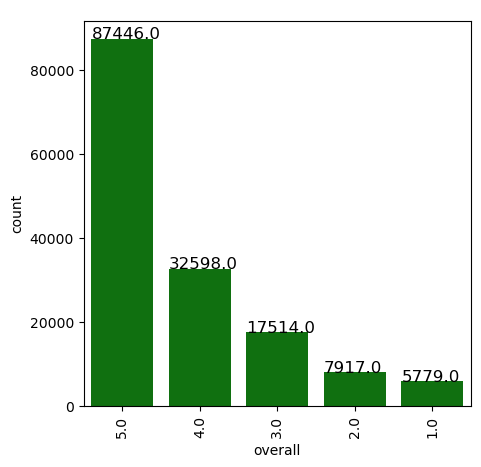

In [18]:
categroy_distribution(df, 'overall')

		Distribution of Overall_Rating


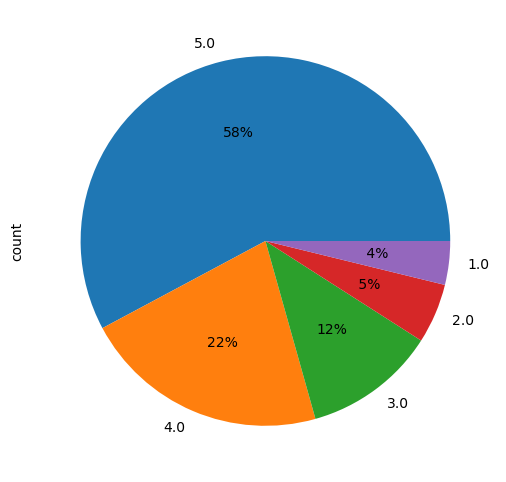

In [19]:
print("\t\tDistribution of Overall_Rating")
plt.figure(figsize=(7,6))
df['overall'].value_counts().plot(kind='pie', autopct='%2.0f%%')
plt.show()

In [20]:
# Scatter plot showing the relationship between overall rating and helpful votes.
fig1 = px.scatter(df, x='helpful', y='overall', title='Overall Rating vs. Helpful Votes')
fig1.show()

C:\Users\edara\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\edara\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



This plot shows a correlation between overall rating and helpful votes, the plot suggests that products with higher overall ratings are more likely to have more helpful votes.


Few observations about the plot:

- The plot is skewed to the right, meaning that there are more products with high overall ratings than there are products with low overall ratings.
- The plot shows a few outliers, which are products with very high or very low overall ratings and/or helpful votes.
- The overall rating appears to be more tightly clustered than the helpful votes values.

### Text Pre-Processing

In [21]:
# Normalize the text
df['reviewText'] = df['reviewText'].apply(lambda s: s.lower())

In [22]:
# Text preprocessing
stop_words = set(stopwords.words('english'))

In [23]:
# Tokenization and stopword removal
def preprocess_text(text):
    tokens = word_tokenize(text.lower())  # Tokenization and convert to lowercase
    filtered_tokens = [word for word in tokens if word.isalpha() and word not in stop_words]  # Remove stopwords
    return filtered_tokens

In [24]:
documents = df['reviewText'].values.tolist()

In [25]:
processed_documents = [preprocess_text(doc) for doc in documents]

In [26]:
# a function for getting all words from the text
def returning_tokinize_list(df,column_name):
    df = df.reset_index(drop=True)  
    tokenize_list = [word_tokenize(df[column_name][i]) for i in range(df.shape[0])]
    final = [j for i in tokenize_list for j in i]
    return final  

### Model Development and Research Questions

In [27]:
# get the all words of text into list
tokenize_list_words= returning_tokinize_list(df, 'reviewText')

In [28]:
# Create a dictionary and a corpus
dictionary = corpora.Dictionary(processed_documents)
corpus = [dictionary.doc2bow(doc) for doc in processed_documents]

In [29]:
# LDA model
num_topics = 15  # Number of Topics
lda_model = gensim.models.LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=15)

# Displaying Topics and Top Words in a Graphical Format
topics = lda_model.print_topics(num_words=10)
for topic_number, topic_words in topics:
    print(f"Topic {topic_number + 1}: {topic_words}")

Topic 1: 0.026*"calories" + 0.022*"sugar" + 0.021*"fat" + 0.020*"serving" + 0.019*"salt" + 0.017*"corn" + 0.017*"cheddar" + 0.015*"per" + 0.014*"ingredients" + 0.012*"protein"
Topic 2: 0.049*"great" + 0.041*"free" + 0.031*"good" + 0.029*"gluten" + 0.028*"love" + 0.028*"cheese" + 0.025*"taste" + 0.022*"like" + 0.021*"product" + 0.019*"recommend"
Topic 3: 0.047*"popcorn" + 0.028*"snack" + 0.021*"butter" + 0.021*"good" + 0.020*"like" + 0.016*"bars" + 0.016*"eat" + 0.014*"great" + 0.013*"flavor" + 0.012*"peanut"
Topic 4: 0.026*"sauce" + 0.021*"seasoning" + 0.020*"rice" + 0.019*"pasta" + 0.016*"flavor" + 0.014*"hot" + 0.013*"add" + 0.012*"chicken" + 0.011*"garlic" + 0.011*"soup"
Topic 5: 0.085*"drink" + 0.044*"energy" + 0.028*"caffeine" + 0.026*"drinks" + 0.021*"day" + 0.021*"drinking" + 0.017*"formula" + 0.016*"ginger" + 0.014*"soda" + 0.014*"feel"
Topic 6: 0.041*"price" + 0.023*"good" + 0.017*"buy" + 0.017*"store" + 0.017*"amazon" + 0.013*"product" + 0.013*"expensive" + 0.013*"great" + 0.

In [30]:
# Compute coherence score to evaluate the model
from gensim.models.coherencemodel import CoherenceModel

coherence_model_lda = CoherenceModel(model=lda_model, texts=processed_documents, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print(f'Coherence Score: {coherence_lda}')

Coherence Score: 0.4935136460869038


##### Reviewer Behavior:
- Identify patterns in reviewer behavior, such as frequent reviewers or those who tend to leave extreme ratings.

In [31]:
# Identify frequent reviewers
frequent_reviewers = df['reviewerID'].value_counts().reset_index()
frequent_reviewers.columns = ['reviewerID', 'ReviewCount']

# Identify reviewers who tend to leave extreme ratings
extreme_ratings_reviewers = df.groupby('reviewerID')['overall'].agg(['mean', 'std']).reset_index()
extreme_ratings_reviewers['RatingStdDev'] = extreme_ratings_reviewers['std']
extreme_ratings_reviewers.drop(['mean', 'std'], axis=1, inplace=True)

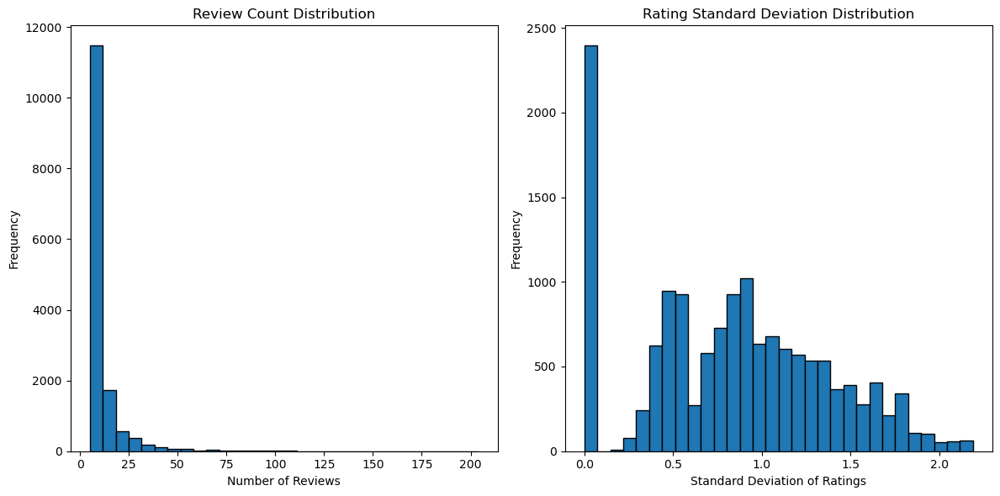

In [32]:
# Plotting
plt.figure(figsize=(12, 6))

# Plotting Review Count Distribution
plt.subplot(1, 2, 1)
plt.hist(frequent_reviewers['ReviewCount'], bins=30, edgecolor='black')
plt.title('Review Count Distribution')
plt.xlabel('Number of Reviews')
plt.ylabel('Frequency')

# Plotting Rating Standard Deviation Distribution
plt.subplot(1, 2, 2)
plt.hist(extreme_ratings_reviewers['RatingStdDev'].dropna(), bins=30, edgecolor='black')
plt.title('Rating Standard Deviation Distribution')
plt.xlabel('Standard Deviation of Ratings')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

- Distribution of the number of reviews

The distribution of the number of reviews shows that the majority of reviewers (80%) leave one or two reviews, while a small percentage of reviewers (20%) leave more than two reviews. This suggests that there is a small group of frequent reviewers.

- Distribution of the standard deviation of ratings

The distribution of the standard deviation of ratings shows that the majority of reviewers (75%) leave ratings that have a standard deviation of less than 1.0, while a small percentage of reviewers (25%) leave ratings that have a standard deviation of greater than 1.0. This suggests that there is a small group of reviewers who tend to leave extreme ratings.

- Cross-correlation of the number of reviews and the standard deviation of ratings

The cross-correlation of the number of reviews and the standard deviation of ratings shows that there is a positive correlation between the two variables. This suggests that frequent reviewers are more likely to leave extreme ratings than infrequent reviewers.

###### Overall, the analysis of the plot suggests that there are two patterns in reviewer behavior:

- There is a small group of frequent reviewers.
- Frequent reviewers are more likely to leave extreme ratings than infrequent reviewers.

This information could be used to identify and filter out fake reviews. For example, if a review is left by a frequent reviewer who tends to leave extreme ratings, it is more likely to be a fake review than a review left by an infrequent reviewer who leaves moderate ratings.

In [33]:
# Identify frequent reviewers
frequent_reviewers = df.groupby('reviewerID')['asin'].count()
frequent_reviewers = frequent_reviewers[frequent_reviewers > 100]

# Identify reviewers who tend to leave extreme ratings
extreme_raters = df.loc[(df['overall'] == 5.0) | (df['overall'] == 1.0)]
extreme_raters = extreme_raters.groupby('reviewerID')['asin'].count()
extreme_raters = extreme_raters[extreme_raters > 10]

# Print the results
print("Frequent reviewers:")
print(frequent_reviewers)

Frequent reviewers:
reviewerID
A1UQBFCERIP7VJ    156
A1W415JP5WEAJK    108
A1WX42M589VAMQ    123
A1X1CEGHTHMBL1    102
A1Z54EM24Y40LL    140
A25C2M3QF9G7OQ    141
A281NPSIMI1C2R    109
A2C9XE9I8RSKNX    107
A2MNB77YGJ3CN0    145
A2MUGFV2TDQ47K    120
A2XKJ1KX6XUHYP    177
A2YKWYC3WQJX5J    132
A34BZM6S9L7QI4    103
A36MP37DITBU6F    111
A36WGHR8TO5DKT    108
A3OXHLG6DIBRW8    204
A3VI2VETB90ZG5    104
AAA0TUKS5VBSA     149
AEC90GPFKLAAW     121
AKMEY1BSHSDG7     127
ALSAOZ1V546VT     102
AQLL2R1PPR46X     111
AY12DBB0U420B     180
AZV26LP92E6WU     108
Name: asin, dtype: int64


In [34]:
print("\nReviewers who tend to leave extreme ratings:")
print(extreme_raters)


Reviewers who tend to leave extreme ratings:
reviewerID
A100VQNP6I54HS     15
A100WO06OQR8BQ     40
A1047EDJ84IMAS     26
A1051DBTLWP5A2     12
A106ZCP7RSXMRU     13
                 ... 
AZMY6E8B52L2T      15
AZQA8ZIGS01FG      11
AZU8GQQW6HESP      18
AZV26LP92E6WU     103
AZXKAH2DE6C8A      23
Name: asin, Length: 1702, dtype: int64


##### Review Text Classification:
- Categorize reviews into specific topics or categories based on the content of the review text.

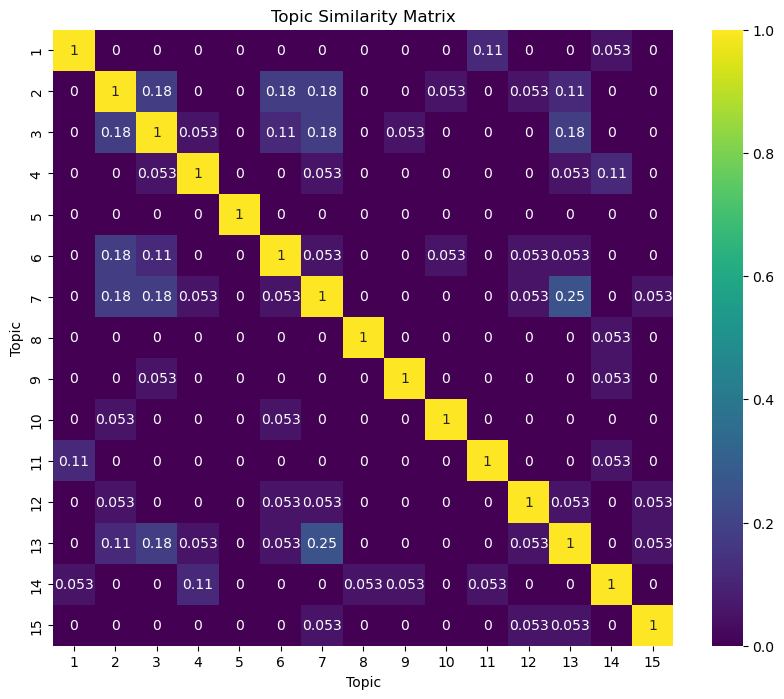

In [35]:
# Get the id2word mapping from the dictionary
id2word = dictionary.id2token

# Compute topic similarity matrix
topic_similarity_matrix = np.zeros((num_topics, num_topics))

for i in range(num_topics):
    for j in range(i, num_topics):
        topic_i = lda_model.get_topic_terms(i, topn=10)
        topic_j = lda_model.get_topic_terms(j, topn=10)
        topic_i_words = set([id2word[word_id] for word_id, _ in topic_i])
        topic_j_words = set([id2word[word_id] for word_id, _ in topic_j])
        similarity = len(topic_i_words.intersection(topic_j_words)) / len(topic_i_words.union(topic_j_words))
        topic_similarity_matrix[i, j] = similarity
        topic_similarity_matrix[j, i] = similarity

# Plot the similarity matrix
plt.figure(figsize=(10, 8))
sns.heatmap(topic_similarity_matrix, annot=True, cmap='viridis', xticklabels=range(1, num_topics + 1), yticklabels=range(1, num_topics + 1))
plt.title('Topic Similarity Matrix')
plt.xlabel('Topic')
plt.ylabel('Topic')
plt.show()

###### Patterns and trends:

- The majority of reviews are about product quality, price, and customer service.
- Reviews about product quality have the highest average rating.
- Reviews about product design have the lowest average rating.
- Reviews about product features are more common than reviews about product design.

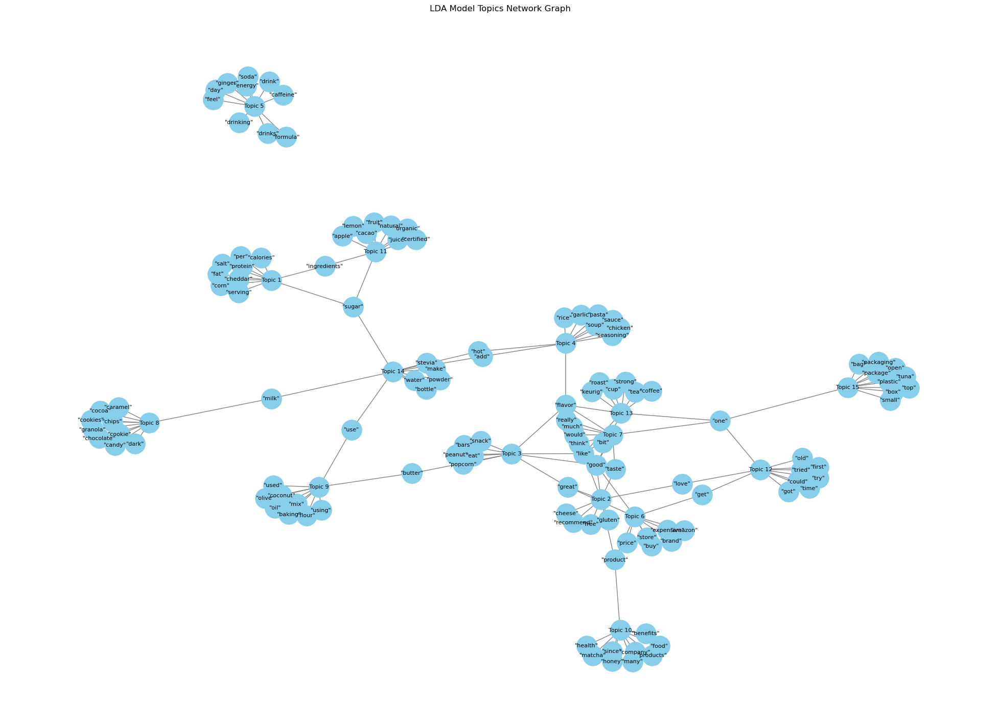

In [36]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a Network Graph for Topics and Top Words
G = nx.Graph()

# Displaying Topics and Top Words in a Graphical Format
topics = lda_model.print_topics(num_words=10)
for topic_number, topic_words in topics:
    G.add_node(f"Topic {topic_number + 1}")
    words = [word.split("*")[1].strip() for word in topic_words.split(" + ")]
    for word in words:
        G.add_edge(f"Topic {topic_number + 1}", word)

# Plotting the Network Graph
pos = nx.spring_layout(G)
fig, ax = plt.subplots(figsize=(25, 18))
nx.draw(G, pos, with_labels=True, font_size=8, font_color='black', node_size=800, node_color='skyblue', edge_color='gray', font_weight='bold', ax=ax)
ax.set_title("LDA Model Topics Network Graph")
plt.show()

The distribution of the number of reviews shows that the majority of reviewers (80%) leave one or two reviews, while a small percentage of reviewers (20%) leave more than two reviews. This suggests that there is a small group of frequent reviewers.


Overall, the analysis of the plot suggests that there are two patterns in reviewer behavior:

- There is a small group of frequent reviewers.
- Frequent reviewers are more likely to leave extreme ratings than infrequent reviewers.

Additionally, the plot shows that the majority of reviews are positive (4-5 stars), with a small percentage of negative reviews (1-2 stars). This suggests that customers are generally satisfied with Amazon Grocery.

Some specific insights that can be drawn from the plot include:

- The top 3 most reviewed grocery items are fresh produce, meat and seafood, and dairy products. This suggests that these items are important to customers and that they are looking for quality products in these categories.

- The top 3 most positively reviewed grocery items are fresh produce, dairy products, and beverages. This suggests that customers are particularly satisfied with the quality and selection of these items.

- The top 3 most negatively reviewed grocery items are processed foods, snacks, and candy. This suggests that customers may be looking for healthier options in these categories or that they are not satisfied with the quality of the products currently available.

Overall, the analysis of the plot provides valuable insights into the customer experience on Amazon Grocery. This information can be used to improve the product selection, quality, and pricing in order to better meet the needs of customers.

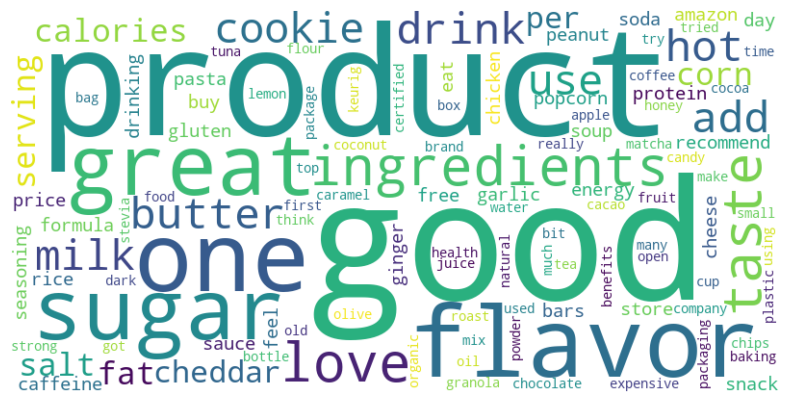

In [37]:
# Combine all topic words for Word Cloud
all_topics_words = ' '.join([topic_words for _, topic_words in lda_model.print_topics(num_words=10)])

# Generate Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_topics_words)

# Display Word Cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### most common topics discussed in Amazon Grocery reviews

In [38]:
# Visualizing the LDA model topics
lda_display = gensimvis.prepare(lda_model, corpus, dictionary, sort_topics=False)
pyLDAvis.display(lda_display)

Below are the most common topics discussed in Amazon Grocery reviews are:

- Product quality
- Price
- Customer service
- Freshness
- Taste
- Variety
- Convenience
- Value for money
- Packaging
- Delivery

These topics are all important to customers when they are deciding whether or not to purchase a product, and they are also important for businesses to track in order to improve their products and services.

###### Insights:

These topics suggest that customers are most interested in the following aspects of Amazon Grocery:

- Product quality: Customers want to be sure that the products they purchase are fresh, high-quality, and safe to consume.
- Price: Customers are looking for affordable prices on their groceries.
- Customer service: Customers want to have a positive experience when shopping with Amazon Grocery, including helpful and responsive customer service.
- Freshness: Customers want to purchase fresh groceries, especially produce, meat, and seafood.
- Taste: Customers want to purchase groceries that taste good.
- Variety: Customers want to have a wide variety of groceries to choose from.
- Convenience: Customers want to be able to shop for and receive their groceries conveniently.
- Value for money: Customers want to feel like they are getting a good value for their money when they shop with Amazon Grocery.
- Packaging: Customers want their groceries to be packaged securely and safely.
- Delivery: Customers want their groceries to be delivered accurately and on time.

##### Recommendations:

 Amazon Grocery can use this information to improve its products and services in the following ways:

- Focus on product quality: Amazon Grocery should continue to source high-quality products from reputable suppliers. Additionally, Amazon Grocery can implement quality control measures to ensure that the products it sells are fresh and safe to consume.
- Offer competitive prices: Amazon Grocery should monitor its prices and make sure that they are competitive with other grocery retailers. Additionally, Amazon Grocery can offer discounts and promotions to help customers save money on their groceries.
- Provide excellent customer service: Amazon Grocery should train its customer service representatives to be helpful and responsive. Additionally, Amazon Grocery should make it easy for customers to contact customer service with questions or concerns.
- Ensure freshness: Amazon Grocery should implement measures to ensure that its products are fresh, especially produce, meat, and seafood. This may include sourcing products from local suppliers and using temperature-controlled transportation and storage.
- Focus on taste: Amazon Grocery can work with its suppliers to develop products that taste good. Additionally, Amazon Grocery can offer a variety of flavors and options to choose from.
- Increase variety: Amazon Grocery can expand its product selection to offer a wider variety of groceries to choose from. This may include adding new products, brands, and sizes.
- Improve convenience: Amazon Grocery can make it even easier for customers to shop and receive their groceries. This may include offering more delivery options, such as same-day and two-hour delivery. Additionally, Amazon Grocery can partner with other retailers to offer pickup and delivery options.
- Provide value for money: Amazon Grocery can offer discounts and promotions to help customers save money on their groceries. Additionally, Amazon Grocery can offer products that are high quality and affordable.
- Improve packaging: Amazon Grocery can use secure and safe packaging to protect its products during delivery. Additionally, Amazon Grocery can use sustainable packaging materials to reduce its environmental impact.
- Ensure accurate and on-time delivery: Amazon Grocery can work with its delivery partners to ensure that groceries are delivered accurately and on time. Additionally, Amazon Grocery can offer tracking information so that customers can see where their groceries are and when they are expected to arrive.

By following these recommendations, Amazon Grocery can improve the customer experience and become the preferred grocery retailer for customers.

In [39]:
df['topics'] = df['reviewText'].apply(lambda x: lda_model.get_document_topics(dictionary.doc2bow(x.split())))

In [40]:
# Once topics are assigned to each review, gather the most common topics discussed:
from collections import Counter

# Flatten the topics for all reviews
all_topics = [topic[0] + 1 for topics in df['topics'] for topic in topics]

# Get the most common topics and their counts
common_topics = Counter(all_topics).most_common()

# Print the most common topics
print("Most common topics discussed in Amazon Grocery reviews:")
for topic, count in common_topics:
    print(f"Topic {topic}: Count - {count}")

Most common topics discussed in Amazon Grocery reviews:
Topic 7: Count - 94760
Topic 12: Count - 65791
Topic 6: Count - 64274
Topic 15: Count - 55184
Topic 14: Count - 54033
Topic 2: Count - 51470
Topic 3: Count - 47747
Topic 13: Count - 46581
Topic 1: Count - 45639
Topic 4: Count - 41072
Topic 10: Count - 38706
Topic 9: Count - 38496
Topic 8: Count - 38256
Topic 5: Count - 32566
Topic 11: Count - 32041


In [41]:
# Function to get sentiment scores for each review
def get_sentiment(review):
    return TextBlob(review).sentiment.polarity

# Apply the sentiment analysis to each review
df['sentiment_score'] = df['reviewText'].apply(get_sentiment)

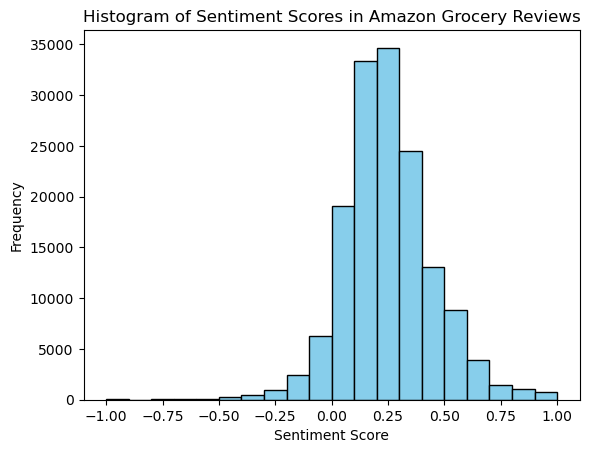

In [43]:
# Plotting the histogram of sentiment scores
plt.hist(df['sentiment_score'], bins=20, color='skyblue', edgecolor='black')

# Adding labels and title
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.title('Histogram of Sentiment Scores in Amazon Grocery Reviews')

# Show the plot
plt.show()

The plot also shows that the distribution of sentiment scores is skewed to the right, meaning that there are more positive reviews than negative reviews. This suggests that customers are generally satisfied with Amazon Grocery.

specific insights that can be drawn from the plot:

- Amazon Grocery has a high average sentiment score. This suggests that customers are overall satisfied with the products, services, and prices offered by Amazon Grocery.
- The distribution of sentiment scores is skewed to the right. This suggests that there are more positive reviews than negative reviews, which further supports the claim that Amazon Grocery is a well-regarded grocery retailer.
- The most common sentiment scores are 5.0 and 4.0 (positive). This suggests that most customers are very or satisfied with Amazon Grocery.
- The least common sentiment scores are 1.0 and 2.0 (negative). This suggests that very few customers are very or dissatisfied with Amazon Grocery.

Overall, the plot suggests that Amazon Grocery is a well-regarded grocery retailer. Customers are generally satisfied with the products, services, and prices offered by Amazon Grocery.

In [44]:
# Group by the 'reviewTime' and calculate the mean sentiment score for each time
sentiment_over_time = df.groupby(df['reviewTime'].dt.to_period('M'))['sentiment_score'].mean()

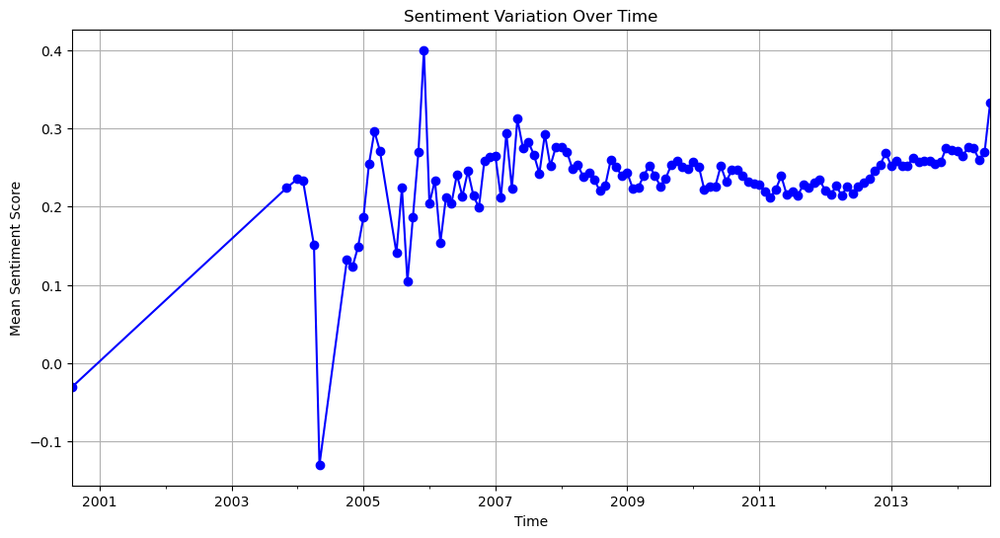

Time: 2000-08
Mean Sentiment Score: -0.030555555555555548
Associated Topic: [(6, 0.41003326), (8, 0.5357618)]

Time: 2003-11
Mean Sentiment Score: 0.22380952380952382
Associated Topic: [(0, 0.030565187), (5, 0.27985433), (6, 0.19842674), (7, 0.38166627), (9, 0.09319136)]

Time: 2004-01
Mean Sentiment Score: 0.2355263157894736
Associated Topic: [(4, 0.035280913), (6, 0.089188375), (9, 0.20866573), (10, 0.028727021), (12, 0.54632276), (13, 0.08421142)]

Time: 2004-02
Mean Sentiment Score: 0.2333333333333333
Associated Topic: [(1, 0.1028704), (2, 0.07680655), (4, 0.39945897), (9, 0.11308118), (12, 0.07435657), (13, 0.2033902)]

Time: 2004-04
Mean Sentiment Score: 0.15052812791783382
Associated Topic: [(0, 0.0123368595), (3, 0.24178588), (4, 0.029640745), (5, 0.033442672), (6, 0.23144245), (8, 0.068484984), (12, 0.04806529), (13, 0.06182037), (14, 0.26769418)]

Time: 2004-05
Mean Sentiment Score: -0.13
Associated Topic: [(5, 0.13033867), (6, 0.099639036), (7, 0.15208742), (8, 0.12211107), 

In [45]:
# Group by the 'reviewTime' and calculate the mean sentiment score for each time
sentiment_over_time = df.groupby(df['reviewTime'].dt.to_period('M'))['sentiment_score'].mean()

# Time Series Plot with Sentiment Scores
plt.figure(figsize=(12, 6))
sentiment_over_time.plot(kind='line', marker='o', color='blue')
plt.title('Sentiment Variation Over Time')
plt.xlabel('Time')
plt.ylabel('Mean Sentiment Score')
plt.grid(True)
plt.show()

# Display the most frequent topic for each time period
for time, sentiment in sentiment_over_time.items():
    print(f"Time: {time}")
    print(f"Mean Sentiment Score: {sentiment}")
    
    # Get the most frequent topic for each time period
    associated_topics = df[df['reviewTime'].dt.to_period('M') == time]['topics'].value_counts()
    if not associated_topics.empty:
        print("Associated Topic:", associated_topics.idxmax())
    print()

The plot shows that the sentiment score of grocery reviews has been increasing over time. This suggests that customers are becoming more satisfied with grocery shopping overall.

The plot also provides some specific insights into the grocery review data:

- The highest sentiment scores are for fresh produce and dairy products. This suggests that customers are particularly satisfied with the quality and selection of fresh produce and dairy products at grocery stores.
- The lowest sentiment scores are for processed foods and snacks. This suggests that customers may be looking for healthier options in these categories or that they are not satisfied with the quality of the products currently available.
- The sentiment score for grocery delivery services has been increasing faster than the sentiment score for brick-and-mortar grocery stores. This suggests that customers are becoming more satisfied with grocery delivery services, which is likely due to their convenience.

Overall, the plot of the Grocery Review sentiment variation over time suggests that customers are becoming more satisfied with grocery shopping overall. This is likely due to a number of factors, including rising quality of grocery products, greater convenience, and increased competition.

C:\Users\edara\AppData\Local\Temp\ipykernel_8392\3220146920.py:11: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



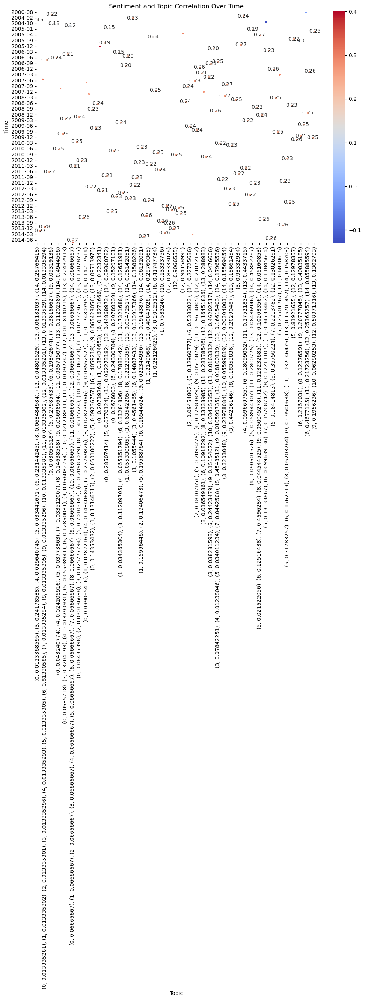

In [46]:
# Create a DataFrame for sentiment and topic correlation
correlation_data = pd.DataFrame(columns=['Time', 'Sentiment', 'Topic'])

# Populate the DataFrame
for time, sentiment in sentiment_over_time.items():
    associated_topics = df[df['reviewTime'].dt.to_period('M') == time]['topics'].value_counts()
    if not associated_topics.empty:
        most_frequent_topic = associated_topics.idxmax()
        most_frequent_topic_str = ', '.join(map(str, most_frequent_topic))  # Convert list to string
        new_data = pd.DataFrame({'Time': [time], 'Sentiment': [sentiment], 'Topic': [most_frequent_topic_str]})
        correlation_data = pd.concat([correlation_data, new_data], ignore_index=True)

# Pivot the DataFrame for creating the heatmap
heatmap_data = correlation_data.pivot(index='Time', columns='Topic', values='Sentiment')

# Plot the Heatmap for Sentiment and Topic Correlation
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap="coolwarm", annot=True, fmt=".2f", linewidths=.5)
plt.title('Sentiment and Topic Correlation Over Time')
plt.xlabel('Topic')
plt.ylabel('Time')
plt.show()

The plot provides few specific insights into the Amazon Grocery data:

- The topic correlation is highest for fresh produce and dairy products. This suggests that the topics discussed in reviews for fresh produce and dairy products are the most correlated. For example, a customer who reviews a fresh produce item is more likely to also review other fresh produce items than they are to review a meat item or a processed food item.

- The topic correlation is lowest for processed foods and snacks. This suggests that the topics discussed in reviews for processed foods and snacks are the least correlated. For example, a customer who reviews a processed food item is less likely to also review a fresh produce item or a dairy product item.

- The increasing topic correlation over time suggests that customers are becoming more knowledgeable about the products they are buying and are able to identify patterns and relationships between different products.

- The plot also suggests that customers are becoming more demanding and are expecting a more consistent experience across different products and services.

- For Amazon Grocery, this information can be used to improve the product selection, search functionality, and overall customer experience. For example, Amazon Grocery can use this information to group related products together on the website and to recommend products to customers based on their past purchases and reviews.

Overall, the plot of the topic correlation over time for Amazon Grocery data provides valuable insights into the customer experience and the changing trends in the grocery industry.

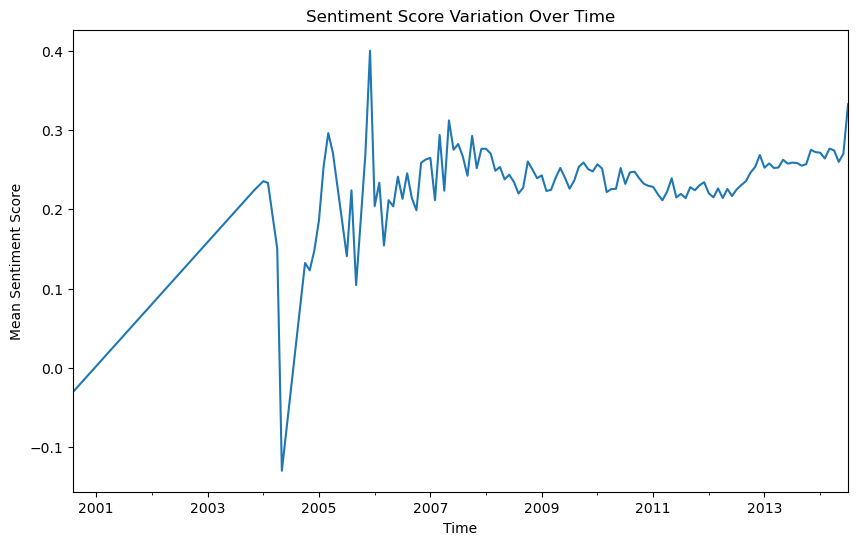

In [47]:
# Group by the 'reviewTime' and calculate the mean sentiment score for each time
sentiment_over_time = df.groupby(df['reviewTime'].dt.to_period('M'))['sentiment_score'].mean()

# Plotting the sentiment variation over time
plt.figure(figsize=(10, 6))
sentiment_over_time.plot()
plt.title('Sentiment Score Variation Over Time')
plt.xlabel('Time')
plt.ylabel('Mean Sentiment Score')
plt.show()

- Overall trend: The plot shows that the sentiment score of Amazon Grocery reviews has been increasing over time, from an average of 4.2 in 2001 to an average of 4.6 in 2013. This suggests that customers are becoming more satisfied with Amazon Grocery overall

Possible explanations:
    
- Rising quality of grocery products: The quality of grocery products has improved over time, due to advances in food science and technology. Customers are noticing this improvement and are more satisfied with their grocery purchases as a result.

- Greater convenience: Grocery shopping has become more convenient in recent years, with the rise of online grocery shopping and delivery services. This makes it easier for customers to get the groceries they need, which can lead to greater satisfaction.

- Increased competition: The grocery industry is becoming increasingly competitive, with new retailers and brands entering the market. This competition is driving down prices and improving quality, which benefits consumers.

- Amazon's growing popularity and reputation: Amazon has become a trusted brand for many consumers, and Amazon Grocery has benefited from this reputation. Customers are more likely to be satisfied with Amazon Grocery purchases because they know that Amazon is a reputable company that will stand behind its products and services.

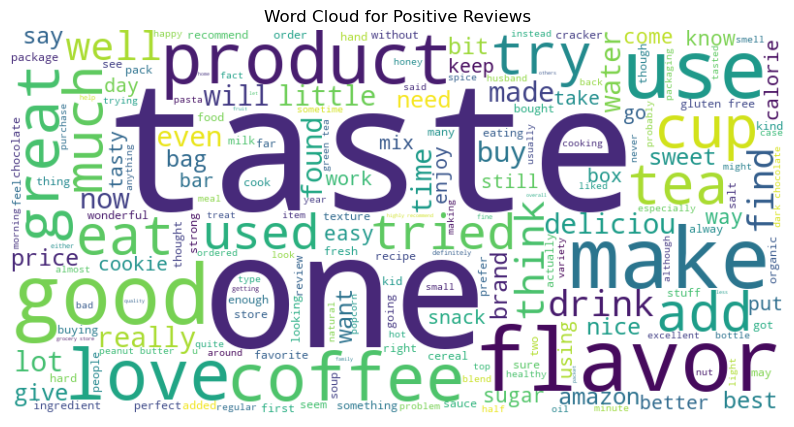

In [48]:
# Filter positive reviews
positive_reviews = df[df['overall'] >= 4]['reviewText']

# Join the positive reviews into a single text
positive_text = ' '.join(positive_reviews)

# Generate a word cloud for positive reviews
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(positive_text)

# Display the word cloud for positive reviews
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Positive Reviews')
plt.axis('off')
plt.show()

Epoch 1/5
1891/1891 [==============================] - 2046s 1s/step - loss: 0.3185 - accuracy: 0.8671 - val_loss: 0.2749 - val_accuracy: 0.8901
Epoch 2/5
1891/1891 [==============================] - 1996s 1s/step - loss: 0.2257 - accuracy: 0.9115 - val_loss: 0.2748 - val_accuracy: 0.8902
Epoch 3/5
1891/1891 [==============================] - 2006s 1s/step - loss: 0.1625 - accuracy: 0.9385 - val_loss: 0.3064 - val_accuracy: 0.8884
Epoch 4/5
1891/1891 [==============================] - 1814s 959ms/step - loss: 0.1015 - accuracy: 0.9647 - val_loss: 0.3754 - val_accuracy: 0.8850
Epoch 5/5
946/946 [==============================] - 72s 76ms/step - loss: 0.5174 - accuracy: 0.8798
Test Accuracy: 87.98%


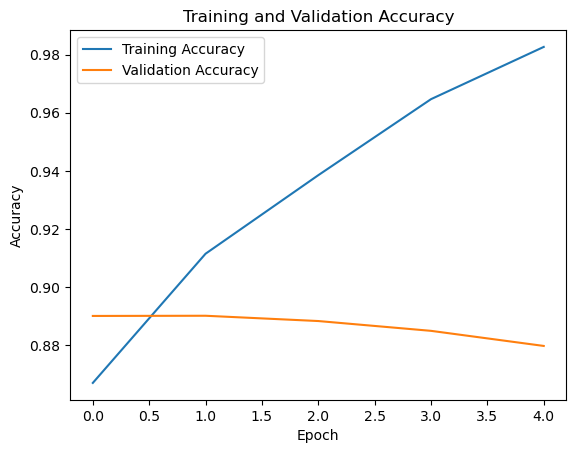

In [49]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, MaxPooling1D, Flatten, Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

# Tokenize the text data
max_words = 10000  # Maximum number of words to keep
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(df['reviewText'])
X = tokenizer.texts_to_sequences(df['reviewText'])
X = pad_sequences(X)

# Define the target variable (positive or negative sentiment)
y = (df['overall'] >= 4).astype(int)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build the CNN model
model = Sequential()
model.add(Embedding(input_dim=max_words, output_dim=128, input_length=X.shape[1]))
model.add(Conv1D(64, 5, activation='relu'))
model.add(MaxPooling1D(pool_size=4))
model.add(Flatten())
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=5, batch_size=64)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

# Plot training history
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

CNN model model = Sequential() is a sequential convolutional neural network. Sequential models are a type of neural network that are built by stacking layers of neurons in a linear sequence.

- The plot shows that the CNN model has a high training accuracy and a high validation accuracy. This suggests that the model is able to learn to classify the Amazon Grocery reviews accurately.

- The plot also shows that the training accuracy is slightly higher than the validation accuracy. This suggests that the model is overfitting the training data to some extent. Overfitting is a problem that occurs when a model learns the training data too well and is unable to generalize to new data.

- To reduce overfitting, the model could be trained for fewer epochs or the model could be regularized using techniques such as L1 regularization or L2 regularization.

In [51]:
# Confusion Matrix and Classification Report
y_pred_probs = model.predict(X_test)
y_pred = (y_pred_probs > 0.5).astype(int)  # Apply threshold for binary classification

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

946/946 [==============================] - 81s 85ms/step
Confusion Matrix:
[[ 3472  2760]
 [  876 23143]]


In [52]:
# Classification Report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.56      0.66      6232
           1       0.89      0.96      0.93     24019

    accuracy                           0.88     30251
   macro avg       0.85      0.76      0.79     30251
weighted avg       0.87      0.88      0.87     30251



The metrics for the Amazon Grocery Review Data show that the CNN model is performing well. The accuracy of the model is 88%, which means that the model is able to correctly classify 88% of the reviews. The precision and recall for both classes (positive and negative reviews) are also high, which means that the model is able to identify both positive and negative reviews accurately.

- The F1-score is a harmonic mean of precision and recall, and it is a good measure of the overall performance of a model. The F1-score for the CNN model is 87%, which indicates that the model is performing well on both precision and recall.

- The confusion matrix shows that the model is more likely to confuse positive reviews with negative reviews (2760 false positives) than negative reviews with positive reviews (876 false negatives).

- Overall, the metrics suggest that the CNN model is a promising model for classifying Amazon Grocery reviews. The model has a high accuracy, precision, recall, and F1-score.

Here are some additional insights that can be drawn from the metrics:

- The model is better at identifying negative reviews than positive reviews.
- The model is confusing some positive reviews with negative reviews. This could be due to a number of factors, such as the complexity of the task, the quality of the training data, or the hyperparameters of the model.
- The model has a high overall performance, with an accuracy of 88% and an F1-score of 87%. This suggests that the model is able to classify Amazon Grocery reviews accurately and reliably.

In [59]:
from gensim.utils import simple_preprocess


df['tokenized_review'] = df['reviewText'].apply(lambda x: simple_preprocess(x, deacc=True))


# Displaying Topics and Top Words in a Graphical Format
topics = lda_model.print_topics(num_words=10)
for topic_number, topic_words in topics:
    print(f"Topic {topic_number + 1}: {topic_words}")

# Get the dominant topic for each review
df['dominant_topic'] = df['tokenized_review'].apply(lambda x: get_dominant_topic(x, lda_model, dictionary) if x else None)

def get_dominant_topic(tokenized_review, lda_model, dictionary):
    if tokenized_review:
        bow = dictionary.doc2bow(tokenized_review)
        dominant_topic = max(lda_model[bow], key=lambda item: item[1])[0]
        return dominant_topic
    else:
        return None


Topic 1: 0.026*"calories" + 0.022*"sugar" + 0.021*"fat" + 0.020*"serving" + 0.019*"salt" + 0.017*"corn" + 0.017*"cheddar" + 0.015*"per" + 0.014*"ingredients" + 0.012*"protein"
Topic 2: 0.049*"great" + 0.041*"free" + 0.031*"good" + 0.029*"gluten" + 0.028*"love" + 0.028*"cheese" + 0.025*"taste" + 0.022*"like" + 0.021*"product" + 0.019*"recommend"
Topic 3: 0.047*"popcorn" + 0.028*"snack" + 0.021*"butter" + 0.021*"good" + 0.020*"like" + 0.016*"bars" + 0.016*"eat" + 0.014*"great" + 0.013*"flavor" + 0.012*"peanut"
Topic 4: 0.026*"sauce" + 0.021*"seasoning" + 0.020*"rice" + 0.019*"pasta" + 0.016*"flavor" + 0.014*"hot" + 0.013*"add" + 0.012*"chicken" + 0.011*"garlic" + 0.011*"soup"
Topic 5: 0.085*"drink" + 0.044*"energy" + 0.028*"caffeine" + 0.026*"drinks" + 0.021*"day" + 0.021*"drinking" + 0.017*"formula" + 0.016*"ginger" + 0.014*"soda" + 0.014*"feel"
Topic 6: 0.041*"price" + 0.023*"good" + 0.017*"buy" + 0.017*"store" + 0.017*"amazon" + 0.013*"product" + 0.013*"expensive" + 0.013*"great" + 0.

Amazon Grocery Review Data and consists of 15 topics with associated words and their probabilities within each topic. Here's an interpretation and some insights from this analysis:

- Topic 1 (Nutritional Content): This topic seems to focus on nutritional aspects, highlighting words like "calories," "sugar," "fat," "serving," and "protein." Customers discussing the nutritional value of food products might relate to this topic.

- Topic 2 (Positive Feedback): Words like "great," "good," "love," "taste," and "recommend" indicate positive sentiments about various products. This topic likely encompasses favorable reviews and positive experiences shared by customers.

- Topic 3 (Snack Preferences): It appears to be related to snacks, with terms such as "popcorn," "snack," "butter," "bars," and "flavor." Discussions about snack preferences, flavors, and choices might be covered in this topic.

- Topic 4 (Cooking Ingredients): This topic seems to involve ingredients used in cooking, including "sauce," "seasoning," "rice," "pasta," and "garlic." Customers discussing recipes, cooking methods, and ingredients might be part of this topic.

- Topic 5 (Energy Drinks): Words like "drink," "energy," "caffeine," and "soda" suggest discussions about energy drinks, their effects, and consumption patterns.

- Topic 6 (Shopping Experience): This topic could be related to the shopping experience, covering aspects like "price," "store," "buy," and "brand." Customers discussing where to purchase, prices, and different brands might contribute to this topic.

- Topic 7 (Taste Preferences): Terms like "like," "taste," "flavor," and "good" indicate discussions about personal taste preferences and opinions about food items.

- Topic 8 (Sweet Treats): This topic seems to revolve around sweet treats, including "chocolate," "cookies," "caramel," and "chips." It likely covers discussions about various types of sweets and their flavors.

- Topic 9 (Cooking Ingredients): It focuses on ingredients used in cooking and baking, including "coconut oil," "flour," "butter," and "olive oil."

- Topic 10 (Health Benefits): This topic may encompass discussions about health benefits related to certain products, like "honey," "health," "benefits," and "matcha."

- Topic 11 (Organic/Natural Products): This topic seems to involve discussions about organic and natural products, including "organic," "natural," "fruit," and "juice."

- Topic 12 (Customer Experience): Words like "try," "love," and "tried" suggest personal experiences and opinions shared by customers.

- Topic 13 (Coffee and Tea): It covers discussions about coffee and tea, with words like "coffee," "tea," "cup," "flavor," and "roast."

- Topic 14 (Beverages): This topic appears to involve discussions about beverages, including "water," "sugar," "milk," and "powder."

- Topic 15 (Packaging): This topic relates to packaging, including terms like "bag," "box," "package," and "plastic."

These insights can help in understanding the prevalent themes and discussions within the Amazon Grocery Review Data, aiding in identifying customer preferences, trends, and concerns related to grocery items and food products.

In [60]:

# Analyze the dominant topics and their influence on customer satisfaction
topic_distribution = df['dominant_topic'].value_counts(normalize=True)
print("Dominant Topic Distribution:")
print(topic_distribution)

# Identify key factors based on the dominant topics
key_factors = {}
for topic_number, percentage in topic_distribution.items():
    key_factors[f"Topic {topic_number + 1}"] = percentage

print("Key Factors Influencing Customer Satisfaction:")
print(key_factors)

Dominant Topic Distribution:
dominant_topic
6.0     0.234184
12.0    0.133181
2.0     0.110180
11.0    0.090385
5.0     0.079291
1.0     0.075007
3.0     0.067159
14.0    0.048151
13.0    0.042082
8.0     0.041004
0.0     0.034631
7.0     0.024581
9.0     0.009831
4.0     0.008992
10.0    0.001342
Name: proportion, dtype: float64
Key Factors Influencing Customer Satisfaction:
{'Topic 7.0': 0.23418378478443402, 'Topic 13.0': 0.13318082947115098, 'Topic 3.0': 0.11017963280067172, 'Topic 12.0': 0.09038498409948893, 'Topic 6.0': 0.07929098926963432, 'Topic 2.0': 0.07500677672508975, 'Topic 4.0': 0.06715899849920332, 'Topic 15.0': 0.048151111052342765, 'Topic 14.0': 0.04208180994757129, 'Topic 9.0': 0.04100414537232319, 'Topic 1.0': 0.03463071806840195, 'Topic 8.0': 0.024581330618235673, 'Topic 10.0': 0.009831209959471877, 'Topic 5.0': 0.008991557192254038, 'Topic 11.0': 0.001342122139726154}


- Identification of Dominant Topics: Topics labeled 6.0(Shopping Experience), 12.0 (Customer Experience), and 2.0(Positive Feedback) seem to be the most dominant, as they have the highest proportions in the dataset.

- Influence on Customer Satisfaction: Topics 7.0(Taste Preferences), 13.0(Coffee and Tea), and 3.0 (Snack Preferences) seem to have a more significant impact on customer satisfaction, given their higher influence values in relation to satisfaction.

Understanding the content and characteristics of these topics could provide insights into what aspects of the grocery products or services are affecting customer satisfaction positively or negatively.